In [ ]:
import numpy as np
from google.colab import drive
import cv2
from google.colab.patches import cv2_imshow 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
train_segmented_images_dl= np.load('/content/gdrive/My Drive/Colab Notebooks/ISIC 2017/unet_dice_bce_adam_masks_256.npy')
test_segmented_images_dl=np.load('/content/gdrive/My Drive/Colab Notebooks/ISIC 2017/test_unet_dice_bce_adam_masks_256.npy')
val_segmented_images_dl=np.load('/content/gdrive/My Drive/Colab Notebooks/ISIC 2017/val_unet_dice_bce_adam_masks_256.npy')
train_masks= np.load('/content/gdrive/My Drive/Colab Notebooks/ISIC 2017/train_masks.npy')
val_masks= np.load('/content/gdrive/My Drive/Colab Notebooks/ISIC 2017/val_masks.npy')
test_masks= np.load('/content/gdrive/My Drive/Colab Notebooks/ISIC 2017/test_masks.npy')

In [ ]:
#Extract Largest Component: Function to fill holes inside a lesion generated mask, and also 
#to eliminate small noisy elements that are not part of the lesion. This function is used as post-processing for the masks that were
#generated from Deep Learning. 
def extract_largest_component(image):
  #Inputs: Image: image to be analyzed

  #The contours present in the image are found 
  contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  #If there is no contour (not image found), then the contour image is the the one that was given as input
  if len(contours)==0:
    contour_image= image
  #In case there are contours in the image
  else:
    #Area is calculated for each of the contours and the one with maximum area is preserved. 
    areas= [cv2.contourArea(i) for i in contours]
    largest_contour_idx= areas.index(max(areas))
    black_image= np.zeros_like(image,np.uint8)
    contour_image= cv2.drawContours(black_image,contours,largest_contour_idx,(255,255,255),-1)
  return contour_image

# Visualization of the masks generated from Deep Learning Pipeline

In [ ]:
th= 0.3730
segmented_images_train_dl_=[]
for i in range(len(train_segmented_images_dl)):
  image= train_segmented_images_dl[i].astype('uint8')
  image[image>th]= 255
  image[image<th]=0
  segmented_images_train_dl_.append(image)

In [ ]:
th= 0.3730
segmented_images_test_dl_=[]
for i in range(len(test_segmented_images_dl)):
  image= test_segmented_images_dl[i].astype('uint8')
  image[image>th]= 255
  image[image<th]=0
  segmented_images_test_dl_.append(image)

In [ ]:
th= 0.3730
segmented_images_val_dl_=[]
for i in range(len(val_segmented_images_dl)):
  image= val_segmented_images_dl[i].astype('uint8')
  image[image>th]= 255
  image[image<th]=0
  segmented_images_val_dl_.append(image)

# Postprocessing of the masks generated from Deep Learning pipeline

In [ ]:
segmented_images_train_dl_final=[]
for i in range(len(segmented_images_train_dl_)):
  segmented_images_train_dl_final.append(extract_largest_component(segmented_images_train_dl_[i]))

In [ ]:
segmented_images_test_dl_final=[]
for i in range(len(segmented_images_test_dl_)):
  segmented_images_test_dl_final.append(extract_largest_component(segmented_images_test_dl_[i]))

In [ ]:
segmented_images_val_dl_final=[]
for i in range(len(segmented_images_val_dl_)):
  segmented_images_val_dl_final.append(extract_largest_component(segmented_images_val_dl_[i]))

In [ ]:
np.save('/content/gdrive/My Drive/Colab Notebooks/Machine and Deep Learning/Project/segmented_images_train_dl.npy',segmented_images_train_dl_final)
np.save('/content/gdrive/My Drive/Colab Notebooks/Machine and Deep Learning/Project/segmented_images_test_dl.npy',segmented_images_test_dl_final)
np.save('/content/gdrive/My Drive/Colab Notebooks/Machine and Deep Learning/Project/segmented_images_val_dl.npy',segmented_images_val_dl_final)

# Comparison of results before and after processing of Deep Learning generated masks.

Showing a comparison of the Ground Truth Masks, the masks generated from deep learning before and after postprocessing, respectively. 

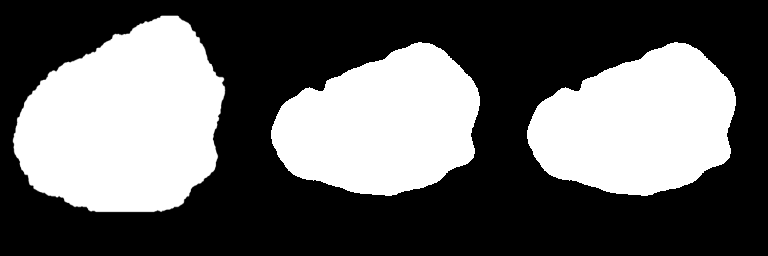

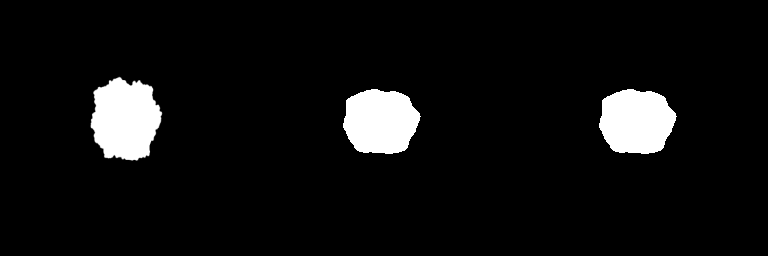

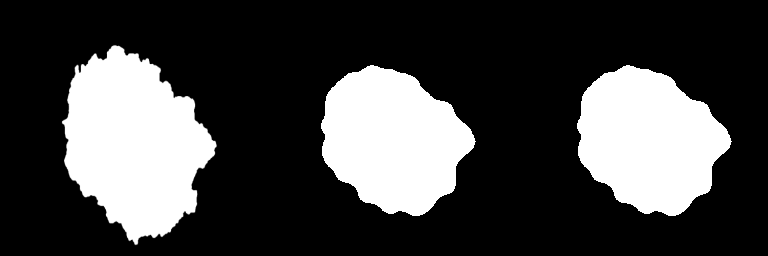

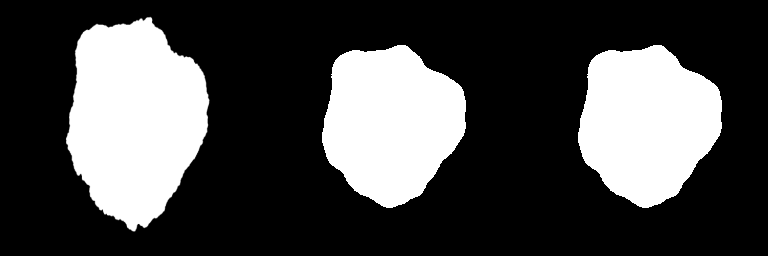

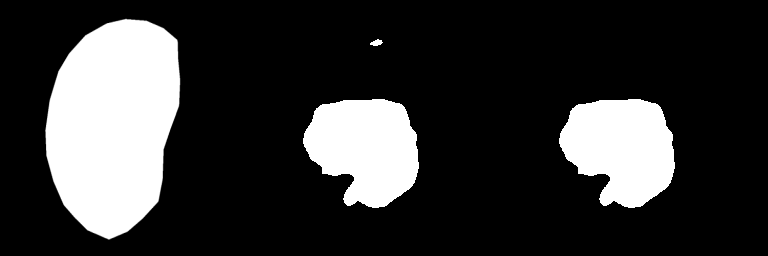

...

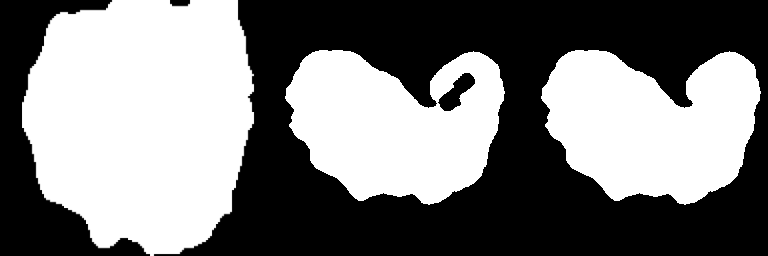

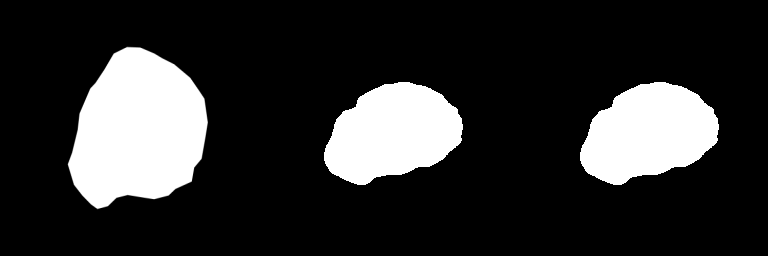

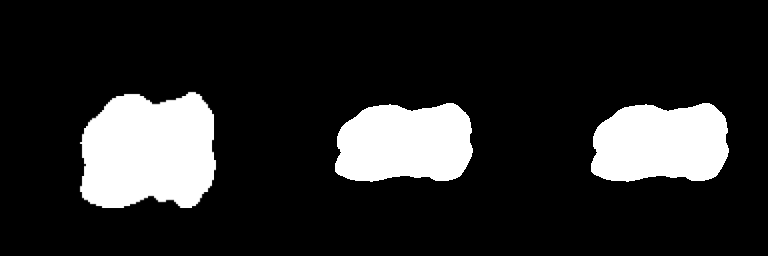

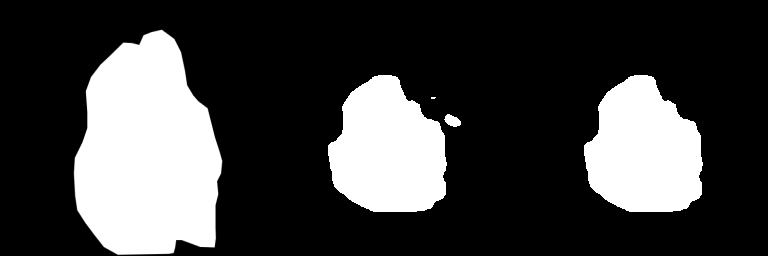

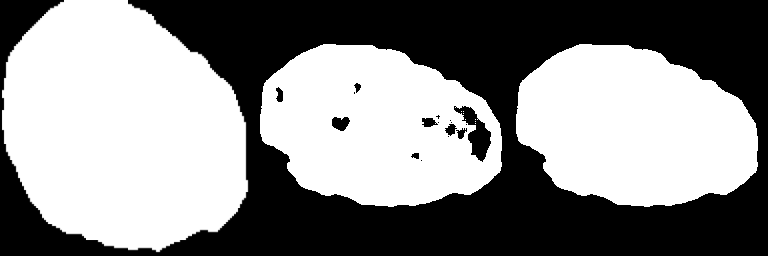

In [ ]:
for i in range(len(train_segmented_images_dl)):
  image=np.concatenate((train_masks[i],segmented_images_train_dl_[i], segmented_images_train_dl_final[i]), axis= 1)
  cv2_imshow(image)

In [ ]:
for i in range(len(test_segmented_images_dl)):
  image=np.concatenate((test_masks[i],segmented_images_test_dl_[i], segmented_images_test_dl_final[i]), axis= 1)
  cv2_imshow(image)

In [ ]:
for i in range(len(val_segmented_images_dl)):
  image=np.concatenate((val_masks[i],segmented_images_val_dl_[i], segmented_images_val_dl_final[i]), axis= 1)
  cv2_imshow(image)